In [28]:
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
plt.rcParams.update({'figure.max_open_warning': 0})
import seaborn as sns

# modeling
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV, RepeatedKFold, cross_val_score,cross_val_predict,KFold
from sklearn.metrics import make_scorer,mean_squared_error
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.svm import LinearSVR, SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor,AdaBoostRegressor
from xgboost import XGBRegressor
from sklearn.preprocessing import PolynomialFeatures,MinMaxScaler,StandardScaler
import lightgbm as lgb

%matplotlib inline

In [2]:
# Load dataset
with open("C:/Users/Stille/Desktop/ML projects/zhengqi_train.txt")  as fr:
    data_train = pd.read_table(fr, sep = "\t")
with open("C:/Users/Stille/Desktop/ML projects/zhengqi_test.txt") as fr_test:
    data_test = pd.read_table(fr_test, sep = "\t")

In [3]:
# Merge train_set and test_set
data_train["origin"] = "train"
data_test["origin"] = "test"
data_all = pd.concat([data_train,data_test], axis = 0, ignore_index = True)

In [4]:
data_all.drop(["V5","V9","V11","V17","V22","V28"], axis = 1, inplace = True)

In [5]:
# Normalize numeric columns
cols_numeric = list(data_all.columns)
cols_numeric.remove("origin")
def scale_minmax(col):
    return (col - col.min()) / (col.max() - col.min())
scale_cols = [col for col in cols_numeric if col != 'target']
data_all[scale_cols] = data_all[scale_cols].apply(scale_minmax, axis = 0)

In [6]:
data_all.describe()

,V0,V1,V2,V3,V4,V6,V7,V8,V10,V12,...,V29,V30,V31,V32,V33,V34,V35,V36,V37,target
count,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,...,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,2888.000000
mean,0.694172,0.721357,0.602300,0.603139,0.523743,0.748823,0.745740,0.715607,0.348518,0.578507,...,0.388683,0.589459,0.792709,0.628824,0.458493,0.483790,0.762873,0.332385,0.545795,0.126353
std,0.144198,0.131443,0.140628,0.152462,0.106430,0.132560,0.132577,0.118105,0.134882,0.105088,...,0.133475,0.130786,0.102976,0.155003,0.099095,0.101020,0.102037,0.127456,0.150356,0.983966
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-3.044000
25%,0.626676,0.679416,0.514414,0.503888,0.478182,0.683324,0.696938,0.664934,0.284327,0.532892,...,0.292445,0.550092,0.761816,0.562461,0.409037,0.454490,0.727273,0.270584,0.445647,-0.350250
50%,0.729488,0.752497,0.617072,0.614270,0.535866,0.774125,0.771974,0.742884,0.366469,0.591635,...,0.375734,0.594428,0.815055,0.643056,0.454518,0.499949,0.800020,0.347056,0.539317,0.313000
75%,0.790195,0.799553,0.700464,0.710474,0.585036,0.842259,0.836405,0.790835,0.432965,0.641971,...,0.471837,0.650798,0.852229,0.719777,0.500000,0.511365,0.800020,0.414861,0.643061,0.793250
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.538000


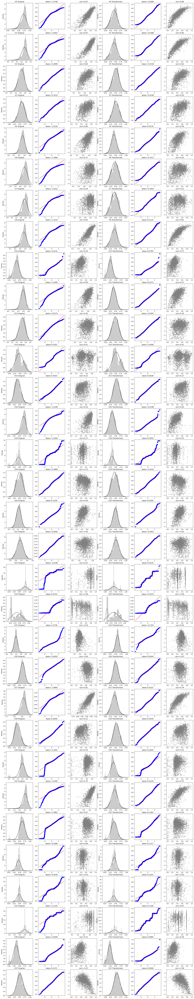

In [7]:
fcols = 6
frows = len(cols_numeric) - 1
plt.figure(figsize = (4 * fcols, 4 * frows))
i = 0

for var in cols_numeric:
    if var != 'target':
        dat = data_all[[var, 'target']].dropna()
        
        i += 1
        plt.subplot(frows, fcols, i)
        sns.distplot(dat[var], color = "gray", fit = stats.norm);
        plt.title(var + ' Original')
        plt.xlabel('')
        
        i += 1
        plt.subplot(frows, fcols, i)
        _ = stats.probplot(dat[var], plot = plt)
        plt.title('skew=' + '{:.4f}'.format(stats.skew(dat[var])))
        plt.xlabel('')
        plt.ylabel('')
        
        i += 1
        plt.subplot(frows, fcols, i)
        plt.plot(dat[var], dat['target'], '.', color = "gray", alpha = 0.5)
        plt.title('corr=' + '{:.2f}'.format(np.corrcoef(dat[var], dat['target'])[0][1]))
 
        i += 1
        plt.subplot(frows, fcols, i)
        trans_var, lambda_var = stats.boxcox(dat[var].dropna() + 1)
        trans_var = scale_minmax(trans_var)      
        sns.distplot(trans_var, color = "gray", fit = stats.norm);
        plt.title(var + ' Transformed')
        plt.xlabel('')
        
        i += 1
        plt.subplot(frows, fcols, i)
        _ = stats.probplot(trans_var, plot = plt)
        plt.title('skew=' + '{:.4f}'.format(stats.skew(trans_var)))
        plt.xlabel('')
        plt.ylabel('')
        
        i += 1
        plt.subplot(frows, fcols, i)
        plt.plot(trans_var, dat['target'], '.', color = "gray", alpha = 0.5)
        plt.title('corr=' + '{:.2f}'.format(np.corrcoef(trans_var,dat['target'])[0][1]))
plt.show()

In [8]:
# Apply boxcox transform to get better normal distribution
cols_transform = data_all.columns[0:-2]
for col in cols_transform:
    # Transform column
    data_all.loc[:, col], _ = stats.boxcox(data_all.loc[:, col] + 1)

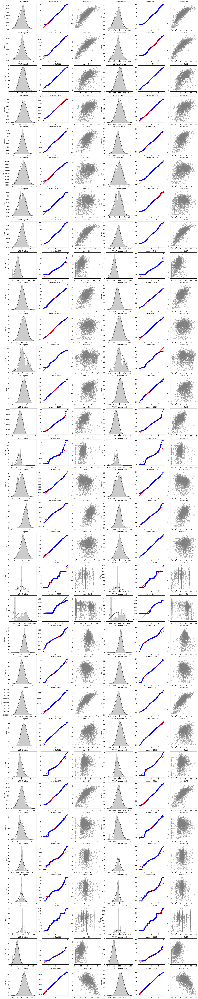

In [9]:
fcols = 6
frows = len(cols_numeric) - 1
plt.figure(figsize = (4 * fcols, 4 * frows))
i = 0

for var in cols_numeric:
    if var != 'target':
        dat = data_all[[var, 'target']].dropna()
        
        i += 1
        plt.subplot(frows, fcols, i)
        sns.distplot(dat[var], color = "gray", fit = stats.norm);
        plt.title(var + ' Original')
        plt.xlabel('')
        
        i += 1
        plt.subplot(frows, fcols, i)
        _ = stats.probplot(dat[var], plot = plt)
        plt.title('skew=' + '{:.4f}'.format(stats.skew(dat[var])))
        plt.xlabel('')
        plt.ylabel('')
        
        i += 1
        plt.subplot(frows, fcols, i)
        plt.plot(dat[var], dat['target'], '.', color = "gray", alpha = 0.5)
        plt.title('corr=' + '{:.2f}'.format(np.corrcoef(dat[var], dat['target'])[0][1]))
 
        i += 1
        plt.subplot(frows, fcols, i)
        trans_var, lambda_var = stats.boxcox(dat[var].dropna() + 1)
        trans_var = scale_minmax(trans_var)      
        sns.distplot(trans_var, color = "gray", fit = stats.norm);
        plt.title(var + ' Transformed')
        plt.xlabel('')
        
        i += 1
        plt.subplot(frows, fcols, i)
        _ = stats.probplot(trans_var, plot = plt)
        plt.title('skew=' + '{:.4f}'.format(stats.skew(trans_var)))
        plt.xlabel('')
        plt.ylabel('')
        
        i += 1
        plt.subplot(frows, fcols, i)
        plt.plot(trans_var, dat['target'], '.', color = "gray", alpha = 0.5)
        plt.title('corr=' + '{:.2f}'.format(np.corrcoef(trans_var,dat['target'])[0][1]))
plt.show()

count    2888.000000
mean        0.126353
std         0.983966
min        -3.044000
25%        -0.350250
50%         0.313000
75%         0.793250
max         2.538000
Name: target, dtype: float64


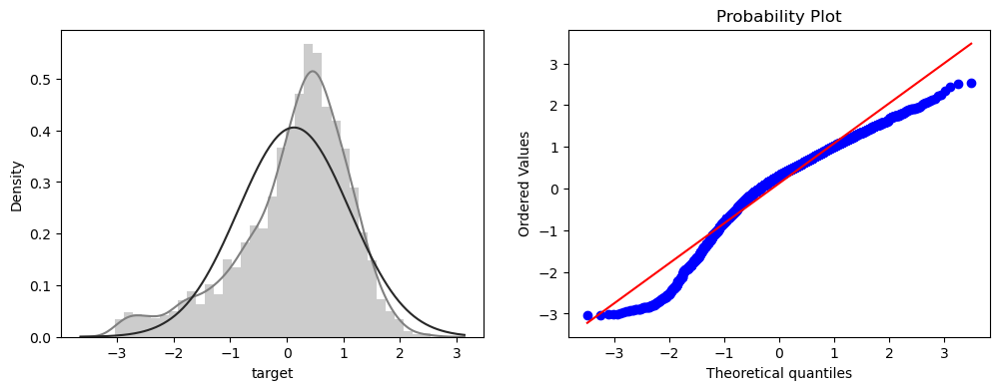

In [10]:
print(data_all.target.describe())

plt.figure(figsize = (12, 4))
plt.subplot(1, 2, 1)
sns.distplot(data_all.target.dropna(), color = "gray", fit = stats.norm);
plt.subplot(1, 2, 2)
_ = stats.probplot(data_all.target.dropna(), plot = plt)
plt.show()

count    2888.000000
mean        1.129957
std         0.394110
min         0.291057
25%         0.867609
50%         1.135315
75%         1.379382
max         2.798463
Name: target, dtype: float64


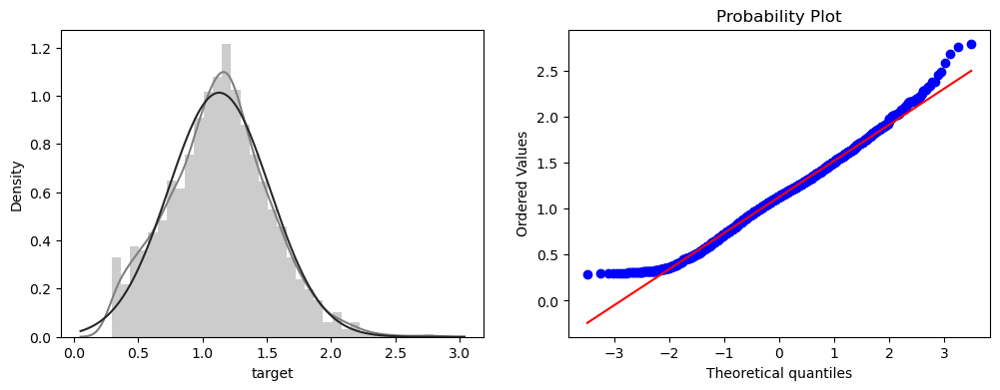

In [11]:
# Log transform target to improve normality
sp = data_train.target
data_train.target1 = np.power(1.5, sp)
print(data_train.target1.describe())

plt.figure(figsize = (12, 4))
plt.subplot(1, 2, 1)
sns.distplot(data_train.target1.dropna(), color = "gray", fit = stats.norm);
plt.subplot(1, 2, 2)
_ = stats.probplot(data_train.target1.dropna(), plot = plt)
plt.show()

In [12]:
# function to get training samples
def get_training_data():
    # extract training samples
    from sklearn.model_selection import train_test_split
    df_train = data_all[data_all["origin"] == "train"]
    df_train["label"] = data_train.target1
    # split target and features
    y = df_train.target
    X = df_train.drop(["origin", "target", "label"], axis = 1)
    X_train,X_valid,y_train,y_valid = train_test_split(X,y,test_size = 0.3, random_state = 100)
    return X_train,X_valid,y_train,y_valid

# extract test data (without target)
def get_test_data():
    df_test = data_all[data_all["origin"] == "test"].reset_index(drop = True)
    return df_test.drop(["origin","target"], axis = 1)

In [13]:
from sklearn.metrics import make_scorer
# Root mean square error
def rmse(y_true, y_pred):
    diff = y_pred - y_true
    sum_sq = sum(diff ** 2)
    n = len(y_pred)
    return np.sqrt(sum_sq / n)

# Mean square error
def mse(y_true, y_pred):
    return mean_squared_error(y_true, y_pred)

# scorer to be used in sklearn model fitting
rmse_scorer = make_scorer(rmse, greater_is_better = False)
mse_scorer = make_scorer(mse, greater_is_better = False)

In [14]:
# function to detect outliers based on the predictions of a model
def find_outliers(model, X, y, sigma = 3):

    # predict y values using model
    try:
        y_pred = pd.Series(model.predict(X), index = y.index)
    # if predicting fails, try fitting the model first
    except:
        model.fit(X, y)
        y_pred = pd.Series(model.predict(X), index = y.index)
        
    # calculate residuals between the model prediction and true y values
    resid = y - y_pred
    mean_resid = resid.mean()
    std_resid = resid.std()

    # calculate z statistic, define outliers to be where |z| > sigma
    z = (resid - mean_resid) / std_resid    
    outliers = z[abs(z) > sigma].index
    
    # print and plot the results
    print('R2 =', model.score(X, y))
    print('rmse =', rmse(y, y_pred))
    print("mse =", mean_squared_error(y, y_pred))
    print('---------------------------------------')

    print('mean of residuals:', mean_resid)
    print('std of residuals:', std_resid)
    print('---------------------------------------')

    print(len(outliers), 'outliers:')
    print(outliers.tolist())

    plt.figure(figsize = (15, 5))
    ax_131 = plt.subplot(1, 3, 1)
    plt.plot(y, y_pred, '.', color = "gray")
    plt.plot(y.loc[outliers], y_pred.loc[outliers], 'rx')
    plt.legend(['Accepted', 'Outlier'])
    plt.xlabel('y')
    plt.ylabel('y_pred');

    ax_132 = plt.subplot(1, 3, 2)
    plt.plot(y, y - y_pred, '.', color = "gray")
    plt.plot(y.loc[outliers], y.loc[outliers] - y_pred.loc[outliers], 'rx')
    plt.legend(['Accepted', 'Outlier'])
    plt.xlabel('y')
    plt.ylabel('y - y_pred');

    ax_133 = plt.subplot(1, 3, 3)
    z.plot.hist(bins = 50, ax = ax_133, color = "gray")
    z.loc[outliers].plot.hist(color = 'r', bins = 50, ax = ax_133)
    plt.legend(['Accepted', 'Outlier'])
    plt.xlabel('z')
    
    plt.savefig('outliers.png')
    plt.show()
    return outliers

R2 = 0.6179535683368015
rmse = 0.6142689695044993
mse = 0.37732636689611937
---------------------------------------
mean of residuals: -6.30206755987125e-16
std of residuals: 0.6144209974661153
---------------------------------------
19 outliers:
[1442, 2255, 2663, 1365, 2030, 2579, 2253, 1126, 332, 2254, 2257, 2636, 1874, 2581, 2580, 884, 1477, 2790, 1932]


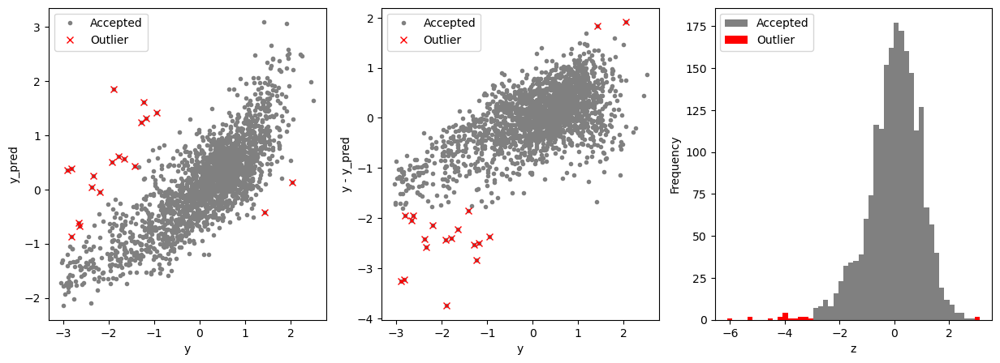

In [15]:
# Using a Lasso model to find and remove outliers
from sklearn.linear_model import Lasso
X_train, X_valid, y_train, y_valid = get_training_data()
test = get_test_data()

outliers = find_outliers(Lasso(), X_train, y_train)

X_outliers = X_train.loc[outliers]
y_outliers = y_train.loc[outliers]
X_t = X_train.drop(outliers)
y_t = y_train.drop(outliers)

R2 = 0.8794138468263232
rmse = 0.3451033885354636
mse = 0.11909634877865909
---------------------------------------
mean of residuals: 6.965674394976242e-17
std of residuals: 0.3451887995969211
---------------------------------------
23 outliers:
[2655, 2159, 1164, 2863, 1145, 2697, 2528, 2645, 691, 1085, 1874, 2647, 776, 2625, 884, 2696, 2668, 1310, 1901, 2769, 2002, 2669, 1040]


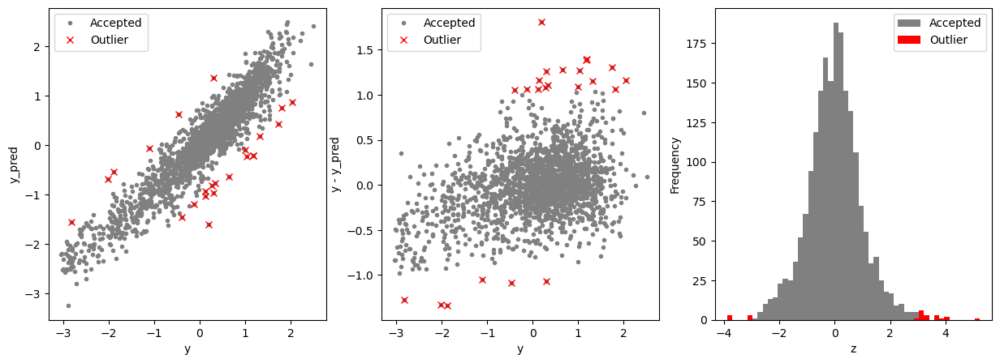

In [16]:
# Using a Ridge model to find and remove outliers
from sklearn.linear_model import Ridge
X_train, X_valid, y_train, y_valid = get_training_data()
test = get_test_data()

outliers = find_outliers(Ridge(), X_train, y_train)

X_outliers = X_train.loc[outliers]
y_outliers = y_train.loc[outliers]
X_t = X_train.drop(outliers)
y_t = y_train.drop(outliers)

In [17]:
def get_trainning_data_omitoutliers():
    y1 = y_t.copy()
    X1 = X_t.copy()
    return X1, y1

In [18]:
# apply grid search and train model
from sklearn.preprocessing import StandardScaler
def train_model(model, param_grid = [], X = [], y = [], 
                splits = 5, repeats = 5):

    # get unmodified training data, unless data to use already specified
    if len(y) == 0:
        X, y = get_trainning_data_omitoutliers()
    
    # create cross-validation method
    rkfold = RepeatedKFold(n_splits = splits, n_repeats = repeats)
    
    # perform a grid search if param_grid given
    if len(param_grid) > 0:
        # set up grid search parameters
        gsearch = GridSearchCV(model, param_grid, cv = rkfold,
                               scoring = "neg_mean_squared_error",
                               verbose = 1, return_train_score = True)

        # search the grid
        gsearch.fit(X, y)

        # extract best model from the grid
        model = gsearch.best_estimator_        
        best_idx = gsearch.best_index_

        # get cv-scores for best model
        grid_results = pd.DataFrame(gsearch.cv_results_)       
        cv_mean = abs(grid_results.loc[best_idx, 'mean_test_score'])
        cv_std = grid_results.loc[best_idx, 'std_test_score']

    # no grid search, just cross-val score for given model    
    else:
        grid_results = []
        cv_results = cross_val_score(model, X, y, scoring = "neg_mean_squared_error", cv = rkfold)
        cv_mean = abs(np.mean(cv_results))
        cv_std = np.std(cv_results)
    
    # combine mean and std cv-score in to a pandas series
    cv_score = pd.Series({'mean':cv_mean, 'std':cv_std})

    # predict y using the fitted model
    y_pred = model.predict(X)
    
    # print stats on model performance         
    print('----------------------')
    print(model)
    print('----------------------')
    print('score =', model.score(X,y))
    print('rmse =', rmse(y, y_pred))
    print('mse =', mse(y, y_pred))
    print('cross_val: mean =', cv_mean, ', std =', cv_std)
    
    # residual plots
    y_pred = pd.Series(y_pred, index = y.index)
    resid = y - y_pred
    mean_resid = resid.mean()
    std_resid = resid.std()
    z = (resid - mean_resid) / std_resid    
    n_outliers = sum(abs(z) > 3)
    
    plt.figure(figsize = (17, 5))
    ax_131 = plt.subplot(1, 3, 1)
    plt.plot(y,y_pred, '.', color = "gray")
    plt.xlabel('y')
    plt.ylabel('y_pred');
    plt.title('corr = {:.3f}'.format(np.corrcoef(y, y_pred)[0][1]))
    ax_132 = plt.subplot(1, 3, 2)
    plt.plot(y, y - y_pred, '.', color = "gray")
    plt.xlabel('y')
    plt.ylabel('y - y_pred');
    plt.title('std resid = {:.3f}'.format(std_resid))
    
    ax_133 = plt.subplot(1, 3, 3)
    z.plot.hist(bins = 50, ax = ax_133, color = "gray")
    plt.xlabel('z')
    plt.title('{:.0f} samples with z>3'.format(n_outliers))
    plt.show()
    return model, cv_score, grid_results

In [19]:
# places to store optimal models and scores
opt_models = dict()
score_models = pd.DataFrame(columns = ['mean','std'])

# no. k-fold splits
splits = 5
# no. k-fold iterations
repeats = 5

Fitting 25 folds for each of 23 candidates, totalling 575 fits
----------------------
Ridge(alpha=0.25)
----------------------
score = 0.8963563380306225
rmse = 0.3189964923305065
mse = 0.10175876211916683
cross_val: mean = 0.106262914903953 , std = 0.005781200993512771


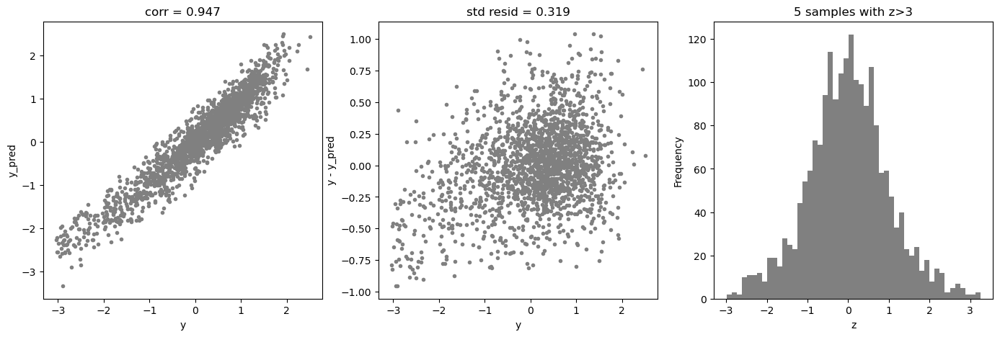

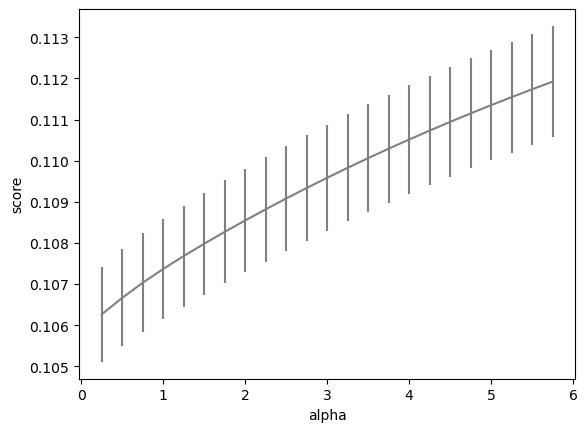

In [20]:
# Ridge regression
model = 'Ridge'

opt_models[model] = Ridge()
alph_range = np.arange(0.25, 6, 0.25)
param_grid = {'alpha': alph_range}

opt_models[model], cv_score, grid_results = train_model(opt_models[model], param_grid = param_grid, 
                                              splits = splits, repeats = repeats)

cv_score.name = model
score_models = score_models.append(cv_score)

plt.figure()
plt.errorbar(alph_range, abs(grid_results['mean_test_score']),
             abs(grid_results['std_test_score']) / np.sqrt(splits * repeats), color = "gray")
plt.xlabel('alpha')
plt.ylabel('score')
plt.show()

Fitting 25 folds for each of 23 candidates, totalling 575 fits
----------------------
Lasso(alpha=0.0001)
----------------------
score = 0.8965376022911505
rmse = 0.3187174209135976
mse = 0.10158079439381537
cross_val: mean = 0.1060893477870308 , std = 0.005313910123497615


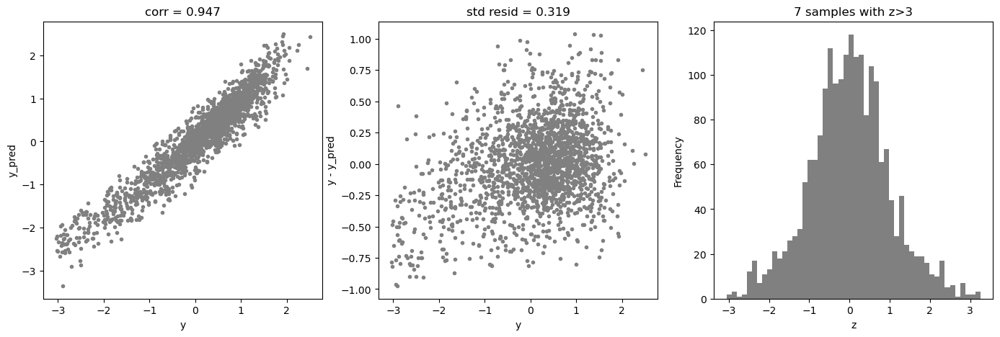

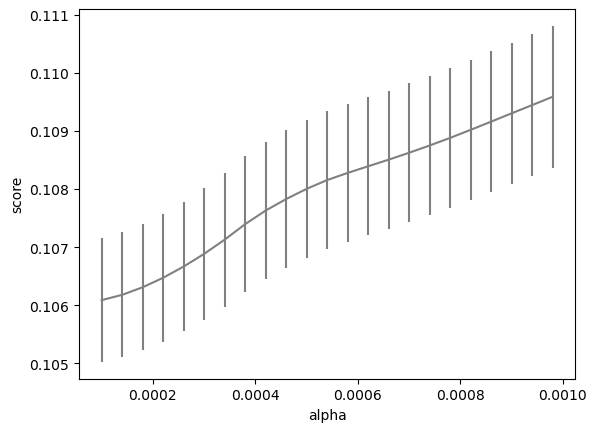

In [21]:
# Lasso regression
model = 'Lasso'

opt_models[model] = Lasso()
alph_range = np.arange(1e-4, 1e-3, 4e-5)
param_grid = {'alpha': alph_range}

opt_models[model], cv_score, grid_results = train_model(opt_models[model], param_grid = param_grid, 
                                              splits = splits, repeats = repeats)

cv_score.name = model
score_models = score_models.append(cv_score)

plt.figure()
plt.errorbar(alph_range, abs(grid_results['mean_test_score']),
             abs(grid_results['std_test_score']) / np.sqrt(splits * repeats), color = "gray")
plt.xlabel('alpha')
plt.ylabel('score')
plt.show()

Fitting 5 folds for each of 81 candidates, totalling 405 fits
----------------------
ElasticNet(alpha=0.0001, l1_ratio=0.7000000000000001, max_iter=100000)
----------------------
score = 0.8965047405323365
rmse = 0.318768032458089
mse = 0.10161305851720151
cross_val: mean = 0.1065034985347871 , std = 0.004986188143151059


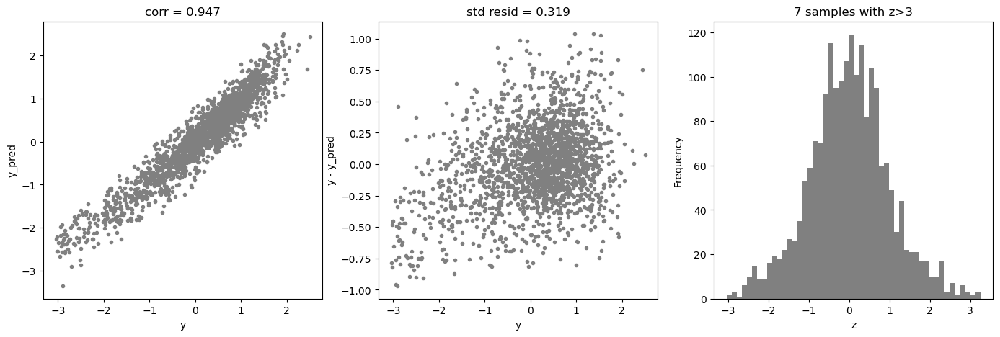

In [22]:
# ElasticNet
model ='ElasticNet'
opt_models[model] = ElasticNet()

param_grid = {'alpha': np.arange(1e-4, 1e-3, 1e-4),
              'l1_ratio': np.arange(0.1, 1.0, 0.1),
              'max_iter': [100000]}

opt_models[model], cv_score, grid_results = train_model(opt_models[model], param_grid = param_grid, 
                                              splits = splits, repeats = 1)

cv_score.name = model
score_models = score_models.append(cv_score)

Fitting 25 folds for each of 9 candidates, totalling 225 fits
----------------------
LinearSVR(C=0.9)
----------------------
score = 0.33444976499444967
rmse = 0.8083602574873535
mse = 0.6534463058850191
cross_val: mean = 0.819636414044092 , std = 0.3076864659271565


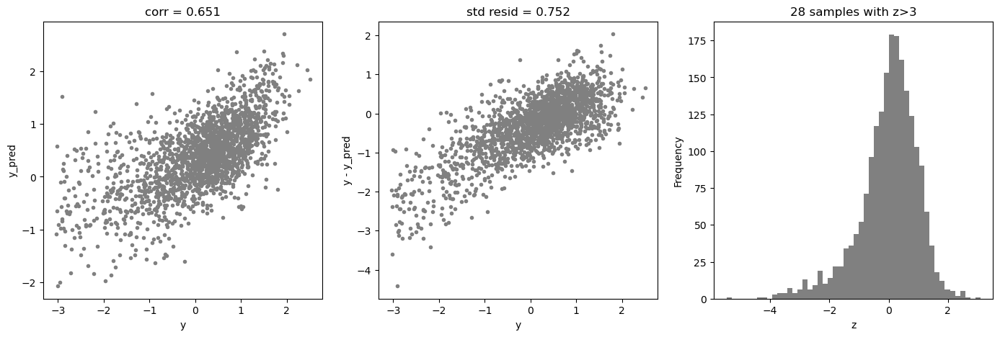

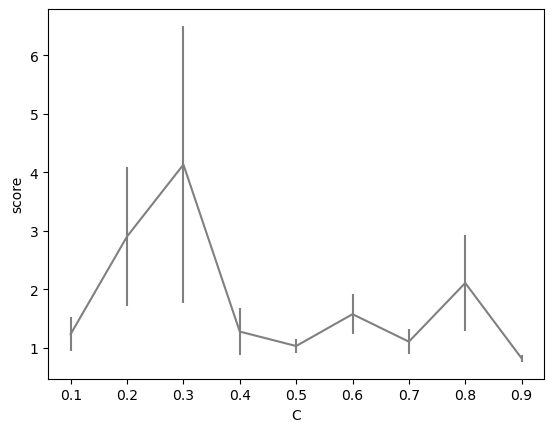

In [23]:
# SVM linear regression
model = 'LinearSVR'
opt_models[model] = LinearSVR()

crange = np.arange(0.1, 1.0, 0.1)
param_grid = {'C':crange,
             'max_iter': [1000]}

opt_models[model], cv_score, grid_results = train_model(opt_models[model], param_grid = param_grid, 
                                              splits = splits, repeats = repeats)
cv_score.name = model
score_models = score_models.append(cv_score)

plt.figure()
plt.errorbar(crange, abs(grid_results['mean_test_score']), 
             abs(grid_results['std_test_score']) / np.sqrt(splits * repeats), color = "gray")
plt.xlabel('C')
plt.ylabel('score')
plt.show()

Fitting 5 folds for each of 8 candidates, totalling 40 fits
----------------------
KNeighborsRegressor(n_neighbors=10)
----------------------
score = 0.7188007679386812
rmse = 0.5254381453364182
mse = 0.27608524457457456
cross_val: mean = 0.3434967497406892 , std = 0.03488114562001407


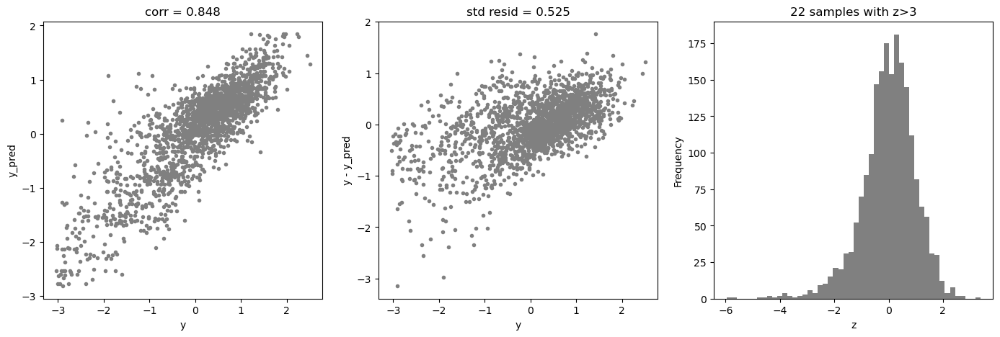

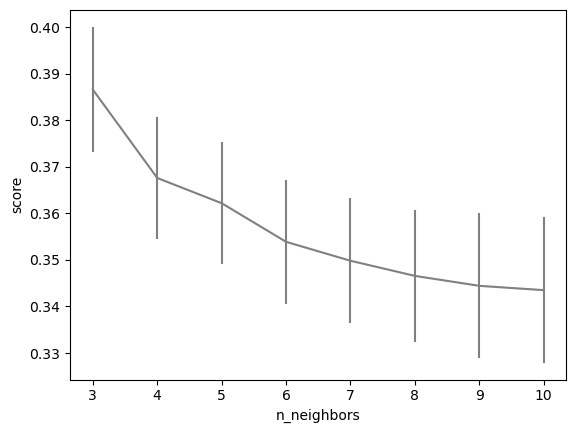

In [24]:
# KNN
model = 'KNeighbors'
opt_models[model] = KNeighborsRegressor()

param_grid = {'n_neighbors':np.arange(3, 11, 1)}

opt_models[model], cv_score, grid_results = train_model(opt_models[model], param_grid = param_grid, 
                                              splits = splits, repeats = 1)

cv_score.name = model
score_models = score_models.append(cv_score)

plt.figure()
plt.errorbar(np.arange(3, 11, 1), abs(grid_results['mean_test_score']),
             abs(grid_results['std_test_score']) / np.sqrt(splits * 1), color = "gray")
plt.xlabel('n_neighbors')
plt.ylabel('score')
plt.show()

Fitting 5 folds for each of 27 candidates, totalling 135 fits
----------------------
GradientBoostingRegressor(min_samples_split=6, n_estimators=350)
----------------------
score = 0.9769626597792231
rmse = 0.15039406604701921
mse = 0.02261837510215513
cross_val: mean = 0.09718720022409348 , std = 0.007941653414262695


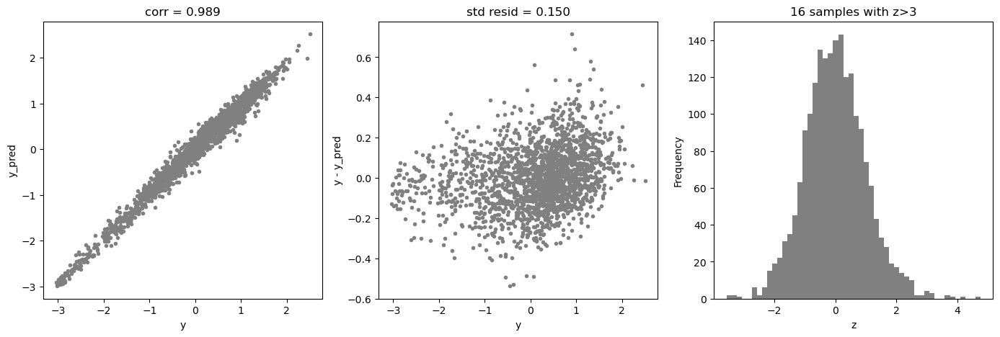

In [25]:
model = 'GradientBoosting'
opt_models[model] = GradientBoostingRegressor()

param_grid = {'n_estimators':[150, 250, 350],
              'max_depth':[1, 2, 3],
              'min_samples_split':[5, 6, 7]}

opt_models[model], cv_score, grid_results = train_model(opt_models[model], param_grid = param_grid, 
                                              splits = splits, repeats = 1)

cv_score.name = model
score_models = score_models.append(cv_score)

Fitting 5 folds for each of 15 candidates, totalling 75 fits
----------------------
XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, enable_categorical=False,
             gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.300000012,
             max_delta_step=0, max_depth=3, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=100, n_jobs=8,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)
----------------------
score = 0.9702586237542838
rmse = 0.1708815062712164
mse = 0.029200489185519693
cross_val: mean = 0.10105169529738638 , std = 0.0032374137134329917


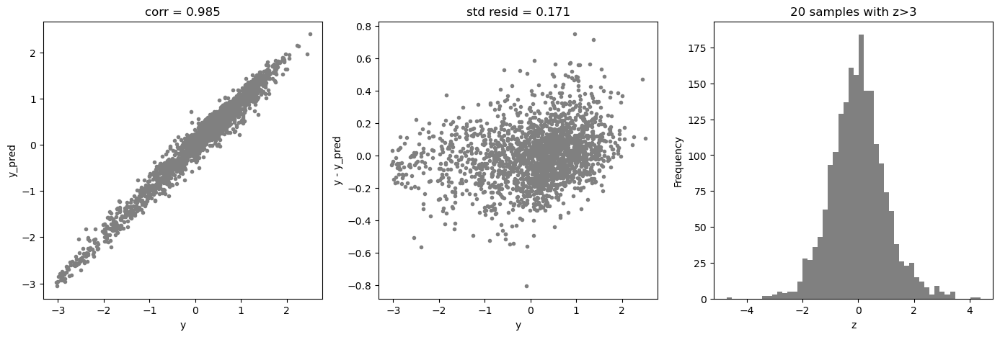

In [26]:
model = 'XGB'
opt_models[model] = XGBRegressor()

param_grid = {'n_estimators':[100, 200, 300, 400, 500],
              'max_depth':[1, 2, 3],
             }

opt_models[model], cv_score, grid_results = train_model(opt_models[model], param_grid = param_grid, 
                                              splits = splits, repeats = 1)

cv_score.name = model
score_models = score_models.append(cv_score)

Fitting 5 folds for each of 15 candidates, totalling 75 fits
----------------------
LGBMRegressor(max_depth=2, n_estimators=500)
----------------------
score = 0.954247271332883
rmse = 0.21194493048274365
mse = 0.04492065355733497
cross_val: mean = 0.09448537493389438 , std = 0.010055883858521932


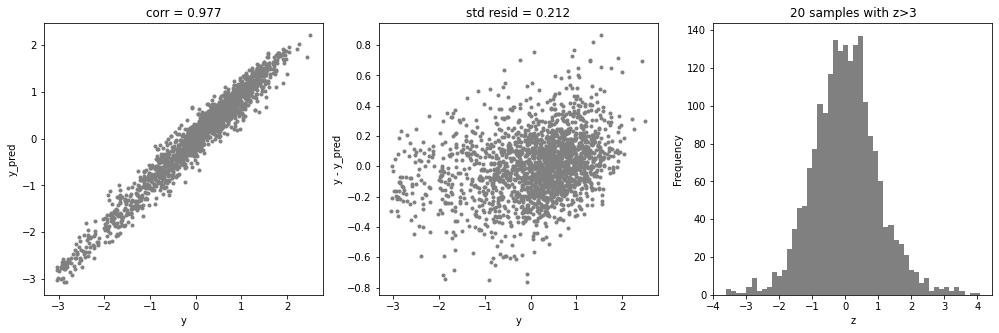

In [29]:
model = 'lgb'
opt_models[model] = lgb.LGBMRegressor()

param_grid = {'n_estimators':[100, 200, 300, 400, 500],
              'max_depth':[1, 2, 3],
             }

opt_models[model], cv_score, grid_results = train_model(opt_models[model], param_grid = param_grid, 
                                              splits = splits, repeats = 1)

cv_score.name = model
score_models = score_models.append(cv_score)

Fitting 5 folds for each of 5 candidates, totalling 25 fits
----------------------
AdaBoostRegressor(n_estimators=200)
----------------------
score = 0.8949257027489542
rmse = 0.3211905655023683
mse = 0.1031633793677313
cross_val: mean = 0.127616567879893 , std = 0.008129468557465672


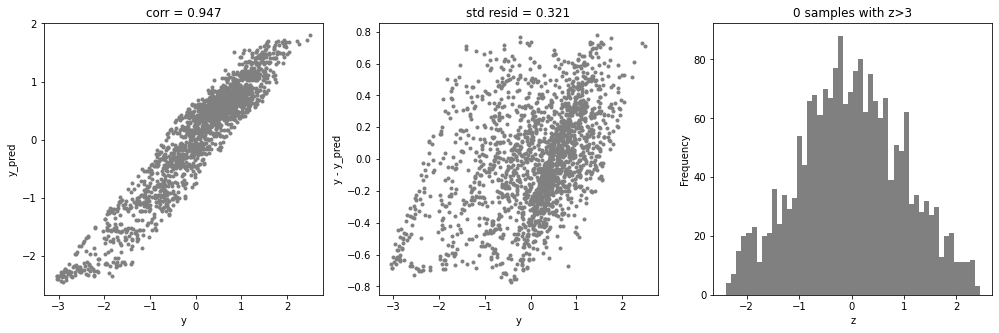

In [30]:
model = 'AdaBoost'
opt_models[model] = AdaBoostRegressor()

param_grid = {'n_estimators':[100, 200, 300, 400, 500],
             }

opt_models[model], cv_score, grid_results = train_model(opt_models[model], param_grid = param_grid, 
                                              splits = splits, repeats = 1)

cv_score.name = model
score_models = score_models.append(cv_score)

Fitting 5 folds for each of 3 candidates, totalling 15 fits
----------------------
RandomForestRegressor(max_features=16)
----------------------
score = 0.9855055592669767
rmse = 0.11929308349363513
mse = 0.014230839769419421
cross_val: mean = 0.10340809624753045 , std = 0.005575675236406686


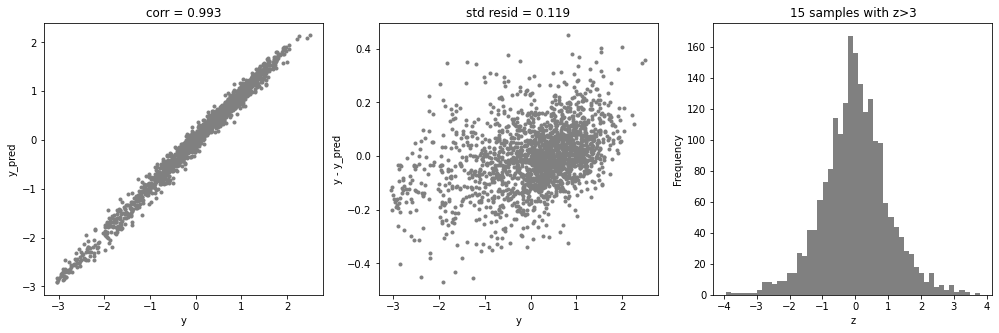

In [31]:
model = 'RandomForest'
opt_models[model] = RandomForestRegressor()

param_grid = {'n_estimators': [100],
              'max_features': [16],
              'min_samples_split':[2, 4, 6]}

opt_models[model], cv_score, grid_results = train_model(opt_models[model], param_grid=param_grid, 
                                              splits = 5, repeats = 1)

cv_score.name = model
score_models = score_models.append(cv_score)

In [32]:
def model_predict(test_data, test_y = [], stack = False):

    i = 0
    y_predict_total = np.zeros((test_data.shape[0],))
    for model in opt_models.keys():
        if model != "LinearSVR" and model != "KNeighbors":
            y_predict = opt_models[model].predict(test_data)
            y_predict_total += y_predict
            i += 1
        if len(test_y) > 0:
            print("{}_mse:".format(model), mean_squared_error(y_predict, test_y))
    y_predict_mean = np.round(y_predict_total / i, 3)
    if len(test_y) > 0:
        print("mean_mse:", mean_squared_error(y_predict_mean, test_y))
    else:
        y_predict_mean = pd.Series(y_predict_mean)
        return y_predict_mean

In [33]:
model_predict(X_valid,y_valid)

Ridge_mse: 0.13767187909664705
Lasso_mse: 0.13786142881850508
ElasticNet_mse: 0.1377682978772289
LinearSVR_mse: 0.1377682978772289
KNeighbors_mse: 0.1377682978772289
GradientBoosting_mse: 0.1333728167220964
XGB_mse: 0.14010339249433112
lgb_mse: 0.13339657987507628
AdaBoost_mse: 0.1652428758523898
RandomForest_mse: 0.13703077437670128
mean_mse: 0.12598749480968857
